# Final Project - Image Classification with CNN

I downloaded the images from the following GitHub in the experiements folder: https://github.com/sand010/maskCNN

**Problem statement:**
This network will help predict whether an individual in the picture is wearing a mask or not. During the COVID pandemic, wearing masks became essential to help slow or prevent the spread of infection, to the point that people could be fined for not wearing masks. This project provides a starting place for identifying these individuals through images, but would hypothetically be extended into identifying individuals through video and track those who did not follow mandates

## Getting started - installing and importing

In [3]:
# make sure modules are installed
%pip install matplotlib
%pip install tensorflow 


[notice] A new release of pip is available: 23.0.1 -> 23.1.2
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.

[notice] A new release of pip is available: 23.0.1 -> 23.1.2
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [4]:
# importing modules
import os
import random
import pathlib
import shutil
import matplotlib.pyplot as plt

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

import numpy as np
import tensorflow as tf
tf.random.set_seed(42)

from PIL import Image, ImageOps
from IPython.display import display
import warnings
warnings.filterwarnings('ignore')

## Setting up folders

In [5]:
# image classes
image_classes = ['mask', 'nomask']

# folders for training, testing, and validation sets
dir_data  = pathlib.Path.cwd().joinpath('data')
dir_train = dir_data.joinpath('train')
dir_valid = dir_data.joinpath('validation')
dir_test  = dir_data.joinpath('test')

# train/test/validation split
pct_train = 0.8
pct_valid = 0.1
pct_test = 0.1

In [6]:
def setup_folder_structure() -> None:
    # create base folders
    if not dir_data.exists():  dir_data.mkdir()
    if not dir_train.exists(): dir_train.mkdir()
    if not dir_valid.exists(): dir_valid.mkdir()
    if not dir_test.exists():  dir_test.mkdir()
    
    # create subfolders for each class
    for cls in image_classes:
        if not dir_train.joinpath(cls).exists(): dir_train.joinpath(cls).mkdir()
        if not dir_valid.joinpath(cls).exists(): dir_valid.joinpath(cls).mkdir()
        if not dir_test.joinpath(cls).exists():  dir_test.joinpath(cls).mkdir()
        
    # print directory structure
    dir_str = os.system('''ls -R data | grep ":$" | sed -e 's/:$//' -e 's/[^-][^\/]*\//--/g' -e 's/^/   /' -e 's/-/|/' ''')
    print(dir_str)
    return

In [7]:
setup_folder_structure()

0
   data
   |-test
   |---mask
   |---nomask
   |-train
   |---mask
   |---nomask
   |-validation
   |---mask
   |---nomask


## Train/Test/Validation split

In [8]:
def train_test_validation_split(src_folder: pathlib.PosixPath, class_name: str) -> dict:
    # for tracking
    n_train, n_valid, n_test = 0, 0, 0
    
    # random seed for reproducibility
    random.seed(42)
    
    # iterate over every image
    for file in src_folder.iterdir():
        image_name = str(file).split('/')[-1]
        
        # make sure it's jpg
        if file.suffix == '.jpg':
            # generate random number
            x = random.random()
            
            tgt_dir = ''
            
            # 0.80 or below
            if x <= pct_train:  
                tgt_dir = 'train'
                n_train += 1
                
            # between .80 and .90
            elif pct_train < x <= (pct_train + pct_valid):  
                tgt_dir = 'validation'
                n_valid += 1
                
            # above .90
            else:  
                tgt_dir = 'test'
                n_test += 1
                
            # copy image
            shutil.copy(
                src=file,
                # data/<train|valid|test>/<mask\nomask>/<something>.jpg
                dst=f'{str(dir_data)}/{tgt_dir}/{class_name}/{image_name}'
            )
            
    return {
        'source': str(src_folder),
        'target': str(dir_data),
        'n_train': n_train,
        'n_validaiton': n_valid,
        'n_test': n_test
    }

In [9]:
%%time

train_test_validation_split(
    src_folder=pathlib.Path.cwd().joinpath('Images/Mask'),
    class_name='mask'
)

CPU times: user 47.5 ms, sys: 93.5 ms, total: 141 ms
Wall time: 158 ms


{'source': '/workspace/MaskComputerVision/Images/Mask',
 'target': '/workspace/MaskComputerVision/data',
 'n_train': 553,
 'n_validaiton': 72,
 'n_test': 65}

In [10]:
%%time

train_test_validation_split(
    src_folder=pathlib.Path.cwd().joinpath('Images/NoMask'),
    class_name='nomask'
)

CPU times: user 32 ms, sys: 98.6 ms, total: 131 ms
Wall time: 140 ms


{'source': '/workspace/MaskComputerVision/Images/NoMask',
 'target': '/workspace/MaskComputerVision/data',
 'n_train': 549,
 'n_validaiton': 72,
 'n_test': 65}

## Samples

In [11]:
def plot_random_sample(img_dir: pathlib.PosixPath):
    # showing 10 images
    n = 10
    # get absolute paths to images
    imgs = random.sample(list(img_dir.iterdir()), n)
    
    num_row = 2
    num_col = 5 

    # create a figure
    fig, axes = plt.subplots(num_row, num_col, figsize=(3.5 * num_col, 3 * num_row))

    for i in range(num_row * num_col):
        # read image
        img = plt.imread(str(imgs[i]))
        # display image
        ax = axes[i // num_col, i % num_col]
        ax.imshow(img)
        # set title as <train|test|validation>/<mask\nomask>/<img_name>.jpg
        ax.set_title('/'.join(str(imgs[i]).split('/')[-3:]))

    plt.tight_layout()
    plt.show()

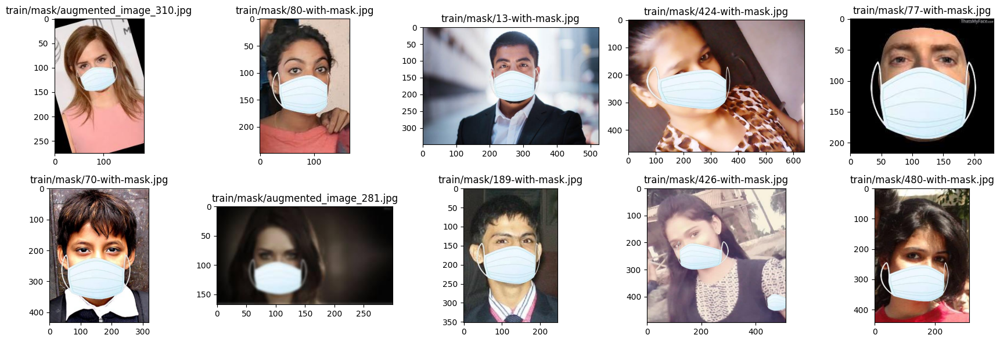

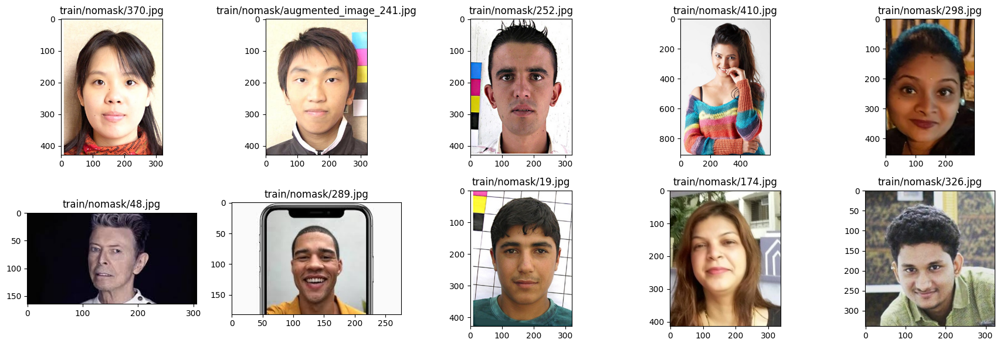

In [12]:
# plotting random train images
plot_random_sample(img_dir=pathlib.Path().cwd().joinpath('data/train/mask'))
plot_random_sample(img_dir=pathlib.Path().cwd().joinpath('data/train/nomask'))

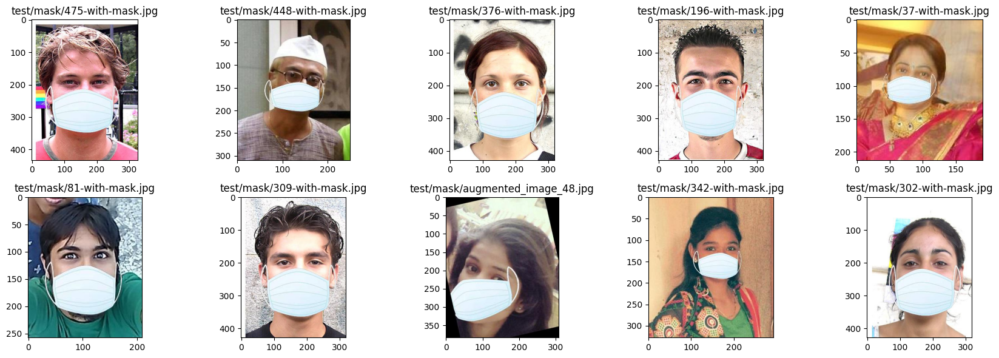

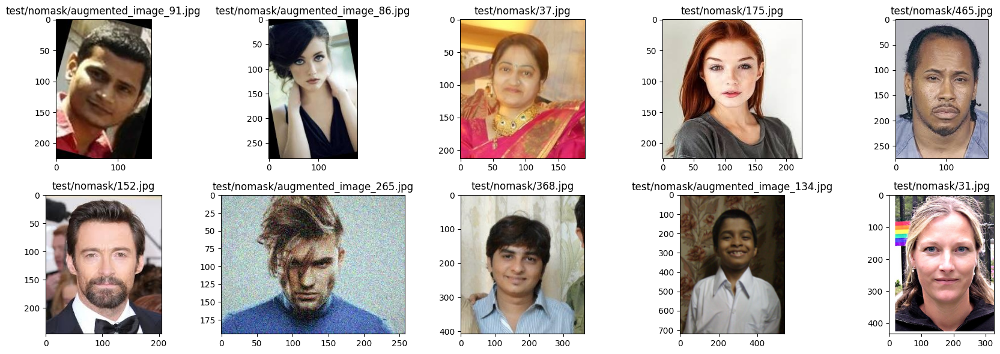

In [13]:
# plotting random test images
plot_random_sample(img_dir=pathlib.Path().cwd().joinpath('data/test/mask'))
plot_random_sample(img_dir=pathlib.Path().cwd().joinpath('data/test/nomask'))

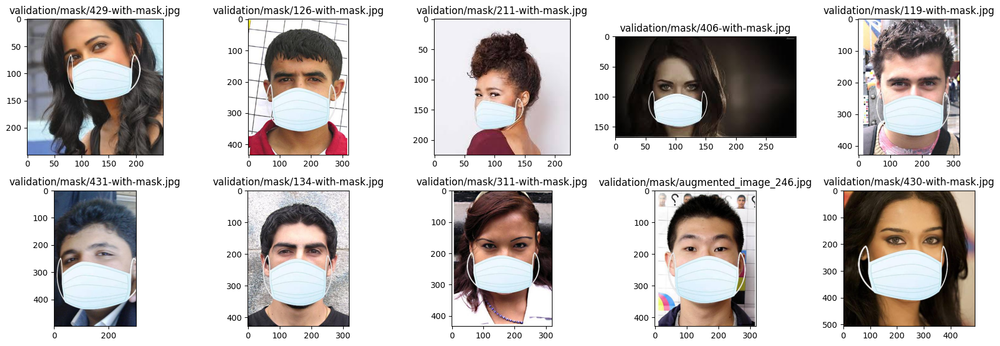

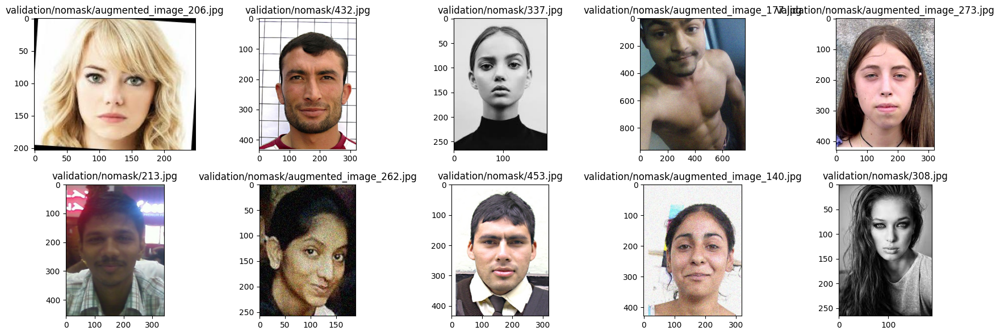

In [14]:
# plotting random validation images
plot_random_sample(img_dir=pathlib.Path().cwd().joinpath('data/validation/mask'))
plot_random_sample(img_dir=pathlib.Path().cwd().joinpath('data/validation/nomask'))

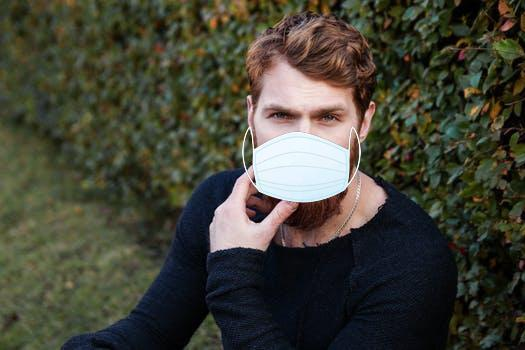

In [15]:
# loading data sample
img1 = Image.open('data/train/mask/0-with-mask.jpg')
display(img1)

## Image Shapes

In [16]:
# checking image shape
np.array(img1).shape

(350, 525, 3)

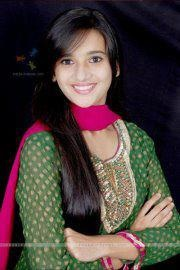

(270, 180, 3)

In [18]:
# loading and checking another image shape
img2 = Image.open('data/train/nomask/0.jpg')
display(img2)
np.array(img2).shape

Image shapes are not similar, so they will need to be resized for network

In [19]:
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1/255.0)
valid_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1/255.0)

In [23]:
train_data = train_datagen.flow_from_directory(
    directory='data/train/',
    target_size=(224, 224),
    class_mode='categorical',
    batch_size=64,
    seed=42
)

Found 1102 images belonging to 2 classes.


In [25]:
# checking first batch and shape
first_batch = train_data.next()
first_batch[0].shape, first_batch[1].shape

((64, 224, 224, 3), (64, 2))

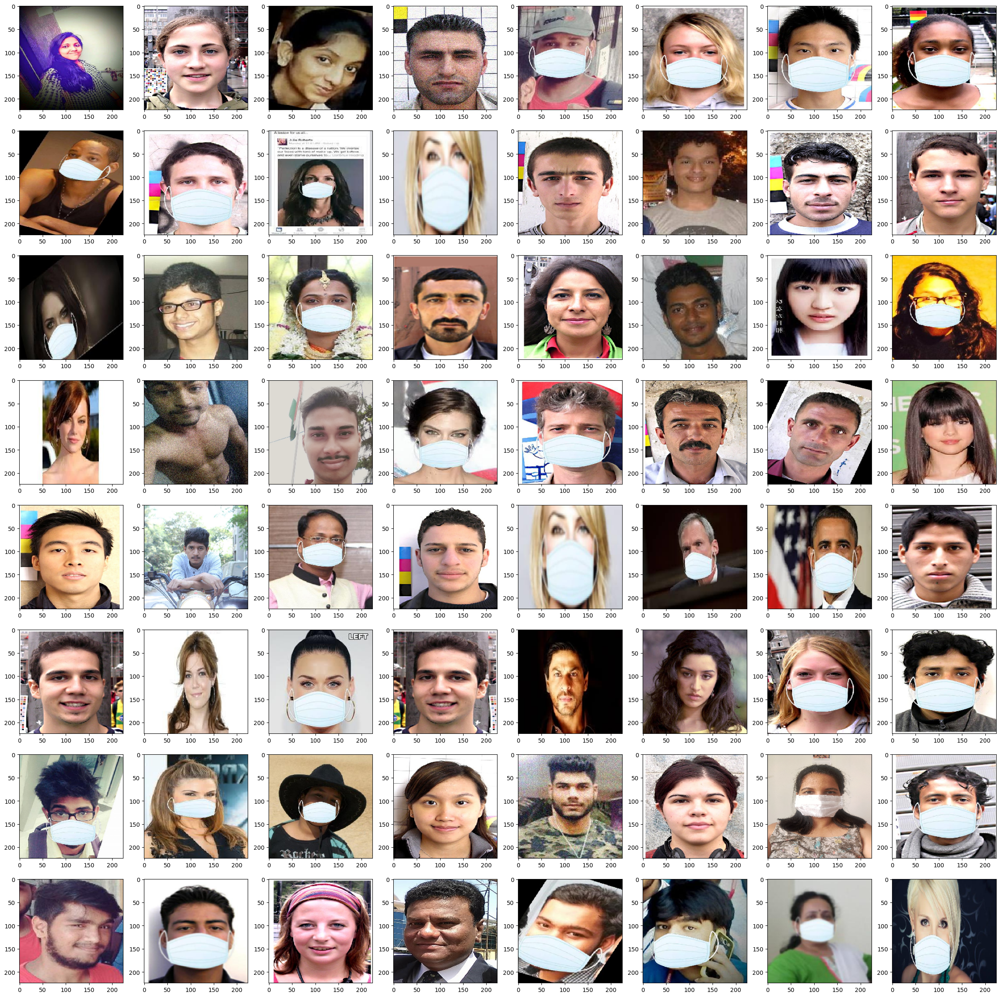

In [28]:
# visualizing single batch
def visualize_batch(batch: tf.keras.preprocessing.image.DirectoryIterator):
    n = 64
    num_row, num_col = 8, 8
    fig, axes = plt.subplots(num_row, num_col, figsize=(3 * num_col, 3 * num_row))
    
    for i in range(n):
        img = np.array(batch[0][i] * 255, dtype='uint8')
        ax = axes[i // num_col, i % num_col]
        ax.imshow(img)
        
    plt.tight_layout()
    plt.show()


visualize_batch(batch=first_batch)

In [29]:
# resetting data loaders
train_data = train_datagen.flow_from_directory(
    directory='data/train/',
    target_size=(224, 224),
    class_mode='categorical',
    batch_size=64,
    seed=42
)

valid_data = valid_datagen.flow_from_directory(
    directory='data/validation/',
    target_size=(224, 224),
    class_mode='categorical',
    batch_size=64,
    seed=42
)

Found 1102 images belonging to 2 classes.
Found 144 images belonging to 2 classes.


## Training CNN

In [1]:
model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(filters=16, kernel_size=(3, 3), input_shape=(224, 224, 3), activation='relu'),
    tf.keras.layers.MaxPool2D(pool_size=(2, 2), padding='same'),
    tf.keras.layers.Conv2D(filters=16, kernel_size=(3, 3), activation='relu'),
    tf.keras.layers.MaxPool2D(pool_size=(2, 2), padding='same'),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(2, activation='softmax')
])

model.compile(
    loss=tf.keras.losses.categorical_crossentropy,
    optimizer=tf.keras.optimizers.Adam(),
    metrics=[tf.keras.metrics.BinaryAccuracy(name='accuracy')]
)

history = model.fit(
    train_data,
    validation_data=valid_data,
    epochs=10
)

NameError: name 'tf' is not defined

96% after 10 epochs

## Making predictions

In [34]:
# preprocessing image before prediction
def prepare_single_image(img_path: str) -> np.array:
    img = Image.open(img_path)
    img = img.resize(size=(224, 224))
    return np.array(img) / 255.0

single_image = prepare_single_image(img_path='data/test/mask/272-with-mask.jpg')
single_image

array([[[0.3254902 , 0.3254902 , 0.3254902 ],
        [0.32941176, 0.32941176, 0.32941176],
        [0.3372549 , 0.3372549 , 0.3372549 ],
        ...,
        [0.45098039, 0.45098039, 0.45098039],
        [0.42745098, 0.42745098, 0.42745098],
        [0.41568627, 0.41568627, 0.41568627]],

       [[0.29803922, 0.29803922, 0.29803922],
        [0.30196078, 0.30196078, 0.30196078],
        [0.30588235, 0.30588235, 0.30588235],
        ...,
        [0.43921569, 0.43921569, 0.43921569],
        [0.41960784, 0.41960784, 0.41960784],
        [0.40784314, 0.40784314, 0.40784314]],

       [[0.27058824, 0.27058824, 0.27058824],
        [0.2745098 , 0.2745098 , 0.2745098 ],
        [0.28235294, 0.28235294, 0.28235294],
        ...,
        [0.42352941, 0.42352941, 0.42352941],
        [0.40784314, 0.40784314, 0.40784314],
        [0.4       , 0.4       , 0.4       ]],

       ...,

       [[0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.00392157, 0

In [36]:
# getting index where value of array is highest - this predicts that the individual is wearing a mask
single_prediction = model.predict(single_image.reshape(-1, 224, 224, 3))
single_prediction.argmax()

1/1 [==============================] - 0s 93ms/step


0

## Making predictions for entire folder

In [37]:
# tracking how many predictions made vs correct predictions
total_mask, correct_mask = 0, 0

for img_path in pathlib.Path.cwd().joinpath('data/test/mask').iterdir():
    try:
        img = prepare_single_image(img_path=str(img_path))
        pred = model.predict(tf.expand_dims(img, axis=0))
        pred = pred.argmax()
        total_mask += 1
        if pred == 0:
            correct_mask += 1
    except Exception as e:
        continue

# getting accuracy for mask images
correct_mask/total_mask

# result is 98%

1/1 [==============================] - 0s 25ms/step


0.9846153846153847

In [38]:
# predictions for no mask folder
total_nomask, correct_nomask = 0, 0

for img_path in pathlib.Path.cwd().joinpath('data/test/nomask').iterdir():
    try:
        img = prepare_single_image(img_path=str(img_path))
        pred = model.predict(tf.expand_dims(img, axis=0))
        pred = pred.argmax()
        total_nomask += 1
        if pred == 1:
            correct_nomask += 1
    except Exception as e:
        continue


# getting accuracy for mask images
correct_nomask/total_nomask

# result is 98%

1/1 [==============================] - 0s 18ms/step


0.9846153846153847